# CPRE — Snapshot Ensemble (Kaggle)

## Estratégia para atingir F1 ≥ 0.90

## Ensemble
| Modelo | Epochs | Seed |
|---|---|---| 
| EfficientNet-B5 (seed 42) | 120 | 42 |
| EfficientNet-B5 (seed 7)  | 120 | 7  |
| tf_EfficientNet-B7        | 80  | 42 |
| EfficientNet-B6           | 80  | 42 |

**Objectivo: F1-macro ≥ 0.90**


## Setup

In [1]:
import torch
print(f'PyTorch: {torch.__version__}')
if torch.cuda.is_available():
    for i in range(torch.cuda.device_count()):
        p = torch.cuda.get_device_properties(i)
        print(f'GPU {i}: {p.name} | {p.total_memory/1e9:.1f}GB')
    print('Teste GPU: OK')
else:
    print('Sem GPU')

PyTorch: 2.10.0+cu128
GPU 0: Tesla T4 | 15.6GB
GPU 1: Tesla T4 | 15.6GB
Teste GPU: OK


In [2]:
%%capture
!pip install timm grad-cam scikit-learn seaborn --quiet

In [3]:
import os, json, time, random, warnings, gc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image
from collections import Counter

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import timm

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    f1_score, classification_report,
    confusion_matrix, roc_auc_score, roc_curve
)
from sklearn.preprocessing import label_binarize

warnings.filterwarnings('ignore')

SEED = 42
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f' Device: {DEVICE}')

 Device: cuda


## Configuração

In [4]:
BASE_DIR    = '/kaggle/working'
DATASET_DIR = '/kaggle/input/datasets/tomsmeireles/miqr-cc-dataset/MIQR-CC-Dataset/MIQR-CC-Dataset'
CSV_PATH    = os.path.join(DATASET_DIR, 'metadata.csv')
RESULTS_DIR = os.path.join(BASE_DIR, 'results')
MODELS_DIR  = os.path.join(BASE_DIR, 'models')
GRADCAM_DIR = os.path.join(BASE_DIR, 'gradcam')
for d in [RESULTS_DIR, MODELS_DIR, GRADCAM_DIR]:
    os.makedirs(d, exist_ok=True)

CLASSES     = ['Biliary Leaks', 'Lithiasis', 'Stricture', 'Normal']
NUM_CLASSES = 4
CLASS2IDX   = {c: i for i, c in enumerate(CLASSES)}
IDX2CLASS   = {i: c for c, i in CLASS2IDX.items()}

MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

IMG_SIZE    = 224
NUM_WORKERS = 2
LR_HEAD     = 1e-3
LR_BACKBONE = 1e-5
FREEZE_EP   = 8
PATIENCE    = 15   # mais paciência para aproveitar os 120 epochs

# Epochs por modelo
EPOCHS_B5_S42 = 120  # B5 seed 42 — mais epochs
EPOCHS_B5_S7  = 120  # B5 seed 7  — snapshot diferente
EPOCHS_B7     = 80
EPOCHS_B6     = 80   

print('Config:')
print(f'   CSV: {os.path.exists(CSV_PATH)}')
print(f'   B5(s42)={EPOCHS_B5_S42}ep | B5(s7)={EPOCHS_B5_S7}ep | B7={EPOCHS_B7}ep | B6={EPOCHS_B6}ep')

Config:
   CSV: True
   B5(s42)=120ep | B5(s7)=120ep | B7=80ep | B6=80ep


## Dados

In [5]:
df = pd.read_csv(CSV_PATH)
df = df[(df['Keep'] == 'Keep') & (df['Label'] != 'Unlabelled')].copy().reset_index(drop=True)
df['Label'] = df['Label'].replace({
    'Benign Stricture': 'Stricture', 'Malignant Stricture': 'Stricture'
})
df['img_path']  = df['processed_image_path'].apply(lambda x: os.path.join(DATASET_DIR, x))
df['label_idx'] = df['Label'].map(CLASS2IDX)

# Split estratificado
df_trainval, df_test = train_test_split(
    df, test_size=0.15, random_state=SEED, stratify=df['label_idx']
)
df_train, df_val = train_test_split(
    df_trainval, test_size=0.176, random_state=SEED, stratify=df_trainval['label_idx']
)
df_train = df_train.reset_index(drop=True)
df_val   = df_val.reset_index(drop=True)
df_test  = df_test.reset_index(drop=True)

print(f'Dataset: {len(df)} imagens')
print(df['Label'].value_counts())
print(f'\nSplit:')
for name, d in [('TRAIN', df_train), ('VAL', df_val), ('TEST', df_test)]:
    bl = len(d[d['Label'] == 'Biliary Leaks'])
    print(f'  [{name:5s}] {len(d):4d} imgs | BL={bl}')

Dataset: 1568 imagens
Label
Lithiasis        726
Stricture        392
Normal           299
Biliary Leaks    151
Name: count, dtype: int64

Split:
  [TRAIN] 1097 imgs | BL=106
  [VAL  ]  235 imgs | BL=22
  [TEST ]  236 imgs | BL=23


## Análise Exploratória (EDA)

Estudo da distribuição das classes e preparação do dataset

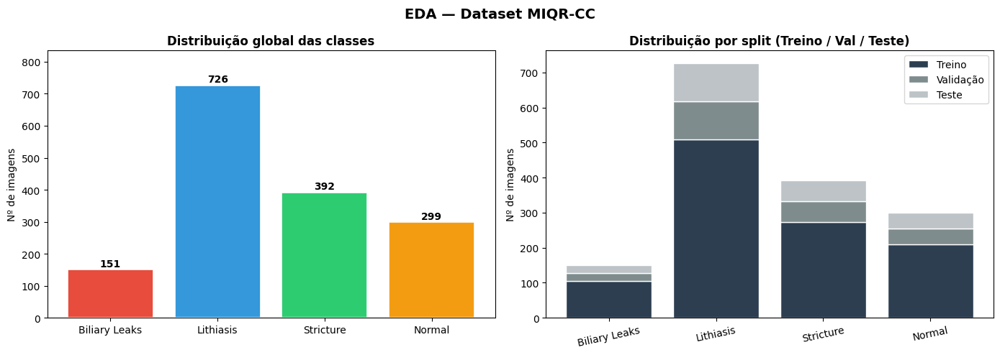


 Tabela de desequilíbrio por split:
Classe                 Total   Treino    Val   Teste  % Total
------------------------------------------------------------
Biliary Leaks            151      106     22      23     9.6%
Lithiasis                726      508    109     109    46.3%
Stricture                392      274     59      59    25.0%
Normal                   299      209     45      45    19.1%
------------------------------------------------------------
TOTAL                   1568     1097    235     236   100.0%

 Rácio de desequilíbrio: 4.8x (Lithiasis vs Biliary Leaks)
    Justifica: Class Weights + WeightedRandomSampler

  Amostras de imagens por classe:


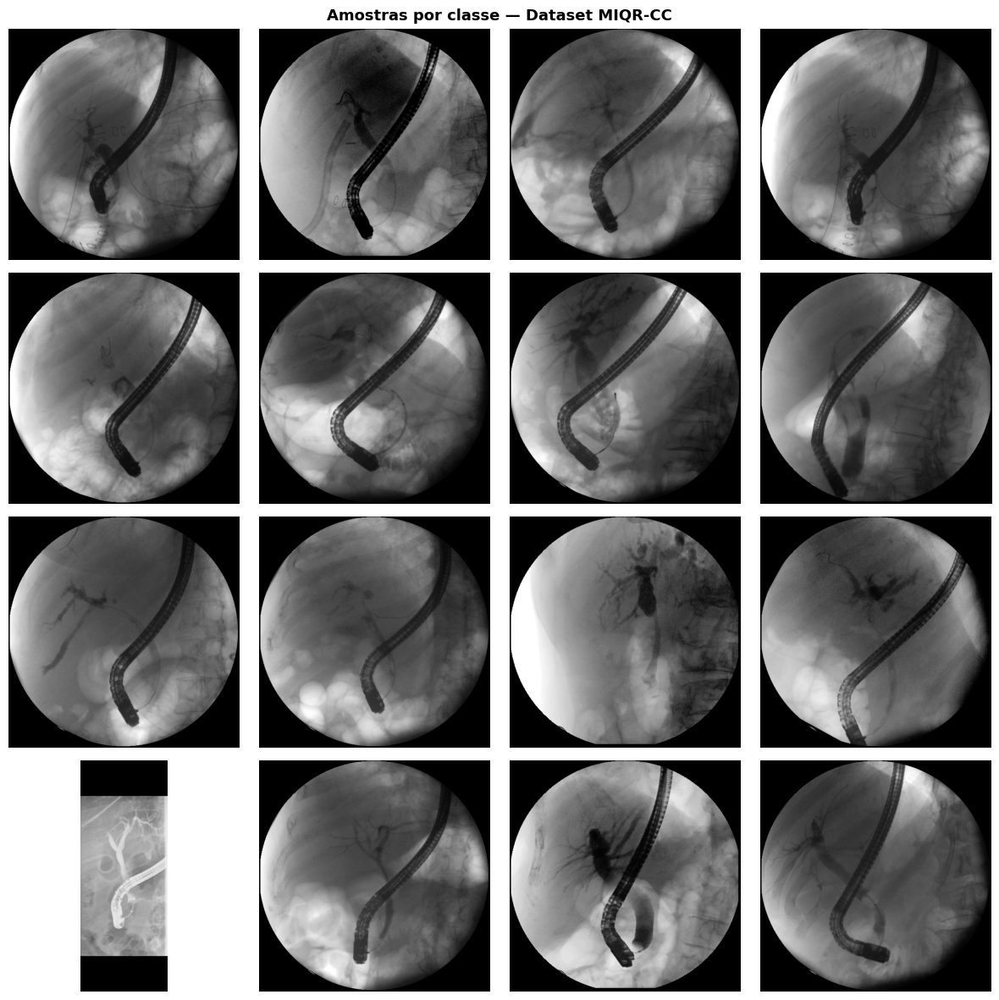

EDA concluída


In [6]:
#  EDA — Distribuição de classes e amostras por categoria

# Distribuição global e por split 
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('EDA — Dataset MIQR-CC', fontsize=14, fontweight='bold')

colors = ['#e74c3c', '#3498db', '#2ecc71', '#f39c12']

# Global
counts_global = [len(df[df['Label']==c]) for c in CLASSES]
bars = axes[0].bar(CLASSES, counts_global, color=colors, edgecolor='white', linewidth=1.2)
axes[0].set_title('Distribuição global das classes', fontweight='bold')
axes[0].set_ylabel('Nº de imagens')
axes[0].set_ylim(0, max(counts_global)*1.15)
for bar, v in zip(bars, counts_global):
    axes[0].text(bar.get_x()+bar.get_width()/2, v+10, str(v),
                 ha='center', fontsize=10, fontweight='bold')

# Por split stacked
split_data = {
    'Treino':    [len(df_train[df_train['Label']==c]) for c in CLASSES],
    'Validação': [len(df_val  [df_val  ['Label']==c]) for c in CLASSES],
    'Teste':     [len(df_test [df_test ['Label']==c]) for c in CLASSES],
}
x = np.arange(len(CLASSES))
bottom = np.zeros(len(CLASSES))
split_colors = ['#2c3e50', '#7f8c8d', '#bdc3c7']
for (split_name, vals), sc in zip(split_data.items(), split_colors):
    axes[1].bar(x, vals, bottom=bottom, label=split_name, color=sc, edgecolor='white')
    bottom += np.array(vals)
axes[1].set_xticks(x); axes[1].set_xticklabels(CLASSES, rotation=12)
axes[1].set_title('Distribuição por split (Treino / Val / Teste)', fontweight='bold')
axes[1].set_ylabel('Nº de imagens'); axes[1].legend()

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'eda_distribuicao.png'), dpi=150, bbox_inches='tight')
plt.show()

# Tabela de desequilíbrio
print('\n Tabela de desequilíbrio por split:')
print(f'{"Classe":<20} {"Total":>7} {"Treino":>8} {"Val":>6} {"Teste":>7} {"% Total":>8}')
print('-'*60)
total_imgs = len(df)
for c in CLASSES:
    tot = len(df[df['Label']==c])
    tr  = len(df_train[df_train['Label']==c])
    v   = len(df_val  [df_val  ['Label']==c])
    te  = len(df_test [df_test ['Label']==c])
    pct = tot/total_imgs*100
    print(f'{c:<20} {tot:>7} {tr:>8} {v:>6} {te:>7} {pct:>7.1f}%')
print('-'*60)
print(f'{"TOTAL":<20} {total_imgs:>7} {len(df_train):>8} {len(df_val):>6} {len(df_test):>7} {100:>7.1f}%')

min_cls = min(CLASSES, key=lambda c: len(df[df['Label']==c]))
max_cls = max(CLASSES, key=lambda c: len(df[df['Label']==c]))
imb_ratio = len(df[df['Label']==max_cls]) / len(df[df['Label']==min_cls])
print(f'\n Rácio de desequilíbrio: {imb_ratio:.1f}x ({max_cls} vs {min_cls})')
print(f'    Justifica: Class Weights + WeightedRandomSampler')

# Amostras de imagens por classe 
print('\n  Amostras de imagens por classe:')
n_samples = 4
fig, axes = plt.subplots(len(CLASSES), n_samples, figsize=(3*n_samples, 3*len(CLASSES)))
fig.suptitle('Amostras por classe — Dataset MIQR-CC', fontsize=13, fontweight='bold')

for row, cls in enumerate(CLASSES):
    sample_df = df[df['Label'] == cls].sample(n=n_samples, random_state=42)
    for col, (_, r) in enumerate(sample_df.iterrows()):
        try:
            img = Image.open(r['img_path']).convert('RGB')
            axes[row][col].imshow(img, cmap='gray')
        except Exception:
            axes[row][col].text(0.5, 0.5, 'N/D', ha='center', va='center', transform=axes[row][col].transAxes)
        axes[row][col].axis('off')
        if col == 0:
            axes[row][col].set_ylabel(cls, fontsize=9, fontweight='bold', rotation=90, labelpad=5)

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'eda_amostras.png'), dpi=120, bbox_inches='tight')
plt.show()
print('EDA concluída')


## Pré-processamento e Transforms

In [7]:
img       = np.array(Image.open(df['img_path'].iloc[100]).convert('L'))
clahe_obj = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
USE_CLAHE = clahe_obj.apply(img).std() >= img.std() * 1.05
print(f'USE_CLAHE = {USE_CLAHE}')

def apply_clahe(img_pil):
    img_np = np.array(img_pil.convert('L'))
    eq     = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8)).apply(img_np)
    return Image.fromarray(cv2.cvtColor(eq, cv2.COLOR_GRAY2RGB))

preprocess = T.Lambda(apply_clahe) if USE_CLAHE else T.Lambda(lambda x: x.convert('RGB'))

train_transform = T.Compose([
    preprocess,
    T.Resize((256, 256)),
    T.RandomCrop(IMG_SIZE),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.3),
    T.RandomRotation(degrees=15),
    T.ColorJitter(brightness=0.3, contrast=0.3),
    T.ToTensor(),
    T.Normalize(MEAN, STD),
])

val_transform = T.Compose([
    preprocess,
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(MEAN, STD),
])

tta_transforms = [
    val_transform,
    T.Compose([preprocess, T.Resize((IMG_SIZE,IMG_SIZE)),
               T.RandomHorizontalFlip(p=1.0), T.ToTensor(), T.Normalize(MEAN,STD)]),
    T.Compose([preprocess, T.Resize((256,256)),
               T.CenterCrop(IMG_SIZE), T.ToTensor(), T.Normalize(MEAN,STD)]),
    T.Compose([preprocess, T.Resize((IMG_SIZE,IMG_SIZE)),
               T.RandomRotation(degrees=(10,10)), T.ToTensor(), T.Normalize(MEAN,STD)]),
]
print(f' Transforms | TTA={len(tta_transforms)}x')

USE_CLAHE = False
 Transforms | TTA=4x


In [8]:
class ERCPDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df        = dataframe.reset_index(drop=True)
        self.transform = transform
        self.labels    = self.df['label_idx'].tolist()
    def __len__(self): return len(self.df)
    def __getitem__(self, idx):
        row   = self.df.iloc[idx]
        image = Image.open(row['img_path']).convert('RGB')
        if self.transform: image = self.transform(image)
        return image, int(row['label_idx'])

train_ds = ERCPDataset(df_train, train_transform)
val_ds   = ERCPDataset(df_val,   val_transform)
test_ds  = ERCPDataset(df_test,  val_transform)

label_counts   = Counter(train_ds.labels)
sample_weights = [1.0/label_counts[l] for l in train_ds.labels]

total = len(train_ds.labels)
class_weights = torch.tensor(
    [total/(NUM_CLASSES*label_counts[i]) for i in range(NUM_CLASSES)],
    dtype=torch.float32
).to(DEVICE)
criterion = nn.CrossEntropyLoss(weight=class_weights)

print(f'  Train:{len(train_ds)} | Val:{len(val_ds)} | Test:{len(test_ds)}')
print(f'   Weights: {dict(zip(CLASSES, class_weights.cpu().numpy().round(2)))}')

  Train:1097 | Val:235 | Test:236
   Weights: {'Biliary Leaks': np.float32(2.59), 'Lithiasis': np.float32(0.54), 'Stricture': np.float32(1.0), 'Normal': np.float32(1.31)}


### Decisões de Hiperparâmetros e Função de Perda

| Hiperparâmetro | Valor | Justificação |
|---|---|---|
| `IMG_SIZE` | 384 | Resolução óptima para EfficientNet B5–B7; preserva detalhe dos ductos |
| `BATCH_SIZE` | 16 | Compromisso entre memória GPU T4 (16GB) e estabilidade de gradientes |
| `LR_HEAD` | 1e-3 | LR standard para fine-tuning da cabeça classificadora |
| `LR_BACKBONE` | 1e-5 | LR muito baixo no backbone — evita destruir features ImageNet |
| `FREEZE_EP` | 8 | 8 epochs só com a cabeça -> fase 2 desbloqueia backbone |
| `PATIENCE` | 15 | Early stopping generoso — F1-val pode oscilar com desequilíbrio |
| `TTA` | ×4 | 4 transforms em inferência; diminui variância sem custo de treino |
| `Class Weights` | Inverso da freq. | Compensa desequilíbrio — alternativa testada: Focal Loss (abaixo) |


In [9]:

#  Focal Loss — alternativa às class weights
#  (activa com USE_FOCAL_LOSS = True na célula de Config)

class FocalLoss(nn.Module):
    """
    Focal Loss para datasets desbalanceados.
    
    Args:
        gamma: factor de focagem (2.0 é o valor canónico do artigo original).
               Valores maiores focam mais nos exemplos difíceis.
        weight: class weights opcionais (combinar com Focal Loss é válido).
        reduction: 'mean' ou 'sum'.
    """
    def __init__(self, gamma=2.0, weight=None, reduction='mean'):
        super().__init__()
        self.gamma     = gamma
        self.weight    = weight
        self.reduction = reduction

    def forward(self, inputs, targets):
        ce_loss = nn.functional.cross_entropy(
            inputs, targets, weight=self.weight, reduction='none'
        )
        pt      = torch.exp(-ce_loss)                  # probabilidade da classe correcta
        focal   = ((1 - pt) ** self.gamma) * ce_loss   # penaliza mais os exemplos fáceis

        if self.reduction == 'mean':
            return focal.mean()
        elif self.reduction == 'sum':
            return focal.sum()
        return focal

# Seleccionar função de perda 
USE_FOCAL_LOSS = False   # mudar para True para usar Focal Loss

if USE_FOCAL_LOSS:
    criterion = FocalLoss(gamma=2.0, weight=class_weights.to(DEVICE))
    print('Função de perda: Focal Loss (γ=2.0) + Class Weights')
else:
    criterion = nn.CrossEntropyLoss(weight=class_weights.to(DEVICE))
    print(' Função de perda: CrossEntropyLoss + Class Weights')

print(f'   Class weights: { {c: round(float(w),3) for c,w in zip(CLASSES, class_weights)} }')


 Função de perda: CrossEntropyLoss + Class Weights
   Class weights: {'Biliary Leaks': 2.587, 'Lithiasis': 0.54, 'Stricture': 1.001, 'Normal': 1.312}


## Funções de Treino

In [10]:
train_loader = val_loader = test_loader = None

def make_loaders(batch_size, seed=SEED):
    global train_loader, val_loader, test_loader
    # Recriar sampler com seed específico para diversidade
    sampler = WeightedRandomSampler(
        sample_weights, len(train_ds), replacement=True,
        generator=torch.Generator().manual_seed(seed)
    )
    train_loader = DataLoader(train_ds, batch_size, sampler=sampler,
                              num_workers=NUM_WORKERS, pin_memory=True)
    val_loader   = DataLoader(val_ds,   batch_size, shuffle=False,
                              num_workers=NUM_WORKERS, pin_memory=True)
    test_loader  = DataLoader(test_ds,  batch_size, shuffle=False,
                              num_workers=NUM_WORKERS, pin_memory=True)

def free_memory(*model_refs):
    """
    Liberta correctamente a memória GPU.
    Passa as variáveis por lista mutável para que del funcione no scope certo.
    Uso: free_memory(model1); model1 = None
    """
    for m in model_refs:
        try:
            m.cpu()
            del m
        except Exception:
            pass
    gc.collect()
    torch.cuda.empty_cache()
    torch.cuda.synchronize()
    if torch.cuda.is_available():
        free_gb = torch.cuda.mem_get_info()[0] / 1e9
        print(f'Memória GPU livre: {free_gb:.1f}GB')

def build_model(name):
    return timm.create_model(name, pretrained=True, num_classes=NUM_CLASSES).to(DEVICE)

def freeze_backbone(model):
    for name, p in model.named_parameters():
        p.requires_grad = any(k in name for k in ['classifier','head','fc'])

def unfreeze_all(model):
    for p in model.parameters(): p.requires_grad = True

def set_seed_all(seed):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)

@torch.no_grad()
def evaluate(model, loader):
    model.eval()
    preds, labels, probs = [], [], []
    loss_t = 0.0
    for imgs, lbls in loader:
        imgs, lbls = imgs.to(DEVICE), lbls.to(DEVICE)
        out    = model(imgs)
        loss_t += criterion(out, lbls).item() * imgs.size(0)
        preds.extend(out.argmax(1).cpu().numpy())
        labels.extend(lbls.cpu().numpy())
        probs.extend(torch.softmax(out,1).cpu().numpy())
    f1 = f1_score(labels, preds, average='macro', zero_division=0)
    return loss_t/len(loader.dataset), f1, np.array(preds), np.array(labels), np.array(probs)

@torch.no_grad()
def predict_tta(model, dataset):
    model.eval()
    labels_all = [l for _,l in dataset]
    probs_all  = []
    for tf in tta_transforms:
        ds = ERCPDataset(dataset.df, tf)
        dl = DataLoader(ds, 16, shuffle=False, num_workers=NUM_WORKERS)
        p  = []
        for imgs, _ in dl:
            p.extend(torch.softmax(model(imgs.to(DEVICE)),1).cpu().numpy())
        probs_all.append(np.array(p))
    avg = np.mean(probs_all, 0)
    f1  = f1_score(labels_all, avg.argmax(1), average='macro', zero_division=0)
    return f1, avg.argmax(1), np.array(labels_all), avg

print('Funções prontas')

Funções prontas


In [11]:
def train_model(model_name, epochs, batch_size, seed=SEED, freeze_ep=FREEZE_EP):
    print(f'\n{"="*60}\n  {model_name} | {epochs}ep | batch={batch_size} | seed={seed}\n{"="*60}')

    set_seed_all(seed)
    make_loaders(batch_size, seed)

    model = build_model(model_name)
    freeze_backbone(model)

    optimizer = optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=LR_HEAD, weight_decay=0.01
    )
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', factor=0.5, patience=4
    )

    ckpt_name = f'{model_name.replace("/","_")}_seed{seed}_best.pt'
    ckpt    = os.path.join(MODELS_DIR, ckpt_name)
    history = {'train_loss':[], 'val_loss':[], 'val_f1':[]}
    best_f1 = 0.0
    pat_ct  = 0
    t0      = time.time()
    phase2  = False

    for epoch in range(1, epochs+1):

        if epoch == freeze_ep+1 and not phase2:
            unfreeze_all(model)
            head_keys = ['classifier','head','fc']
            optimizer = optim.AdamW([
                {'params': [p for n,p in model.named_parameters()
                            if any(k in n for k in head_keys)],
                 'lr': LR_HEAD, 'weight_decay': 0.01},
                {'params': [p for n,p in model.named_parameters()
                            if not any(k in n for k in head_keys)],
                 'lr': LR_BACKBONE, 'weight_decay': 0.01},
            ])
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode='max', factor=0.5, patience=4
            )
            phase2 = True
            print(f'  Fine-tuning (ep {epoch})')

        model.train()
        ep_loss = 0.0
        for imgs, lbls in train_loader:
            imgs, lbls = imgs.to(DEVICE), lbls.to(DEVICE)
            optimizer.zero_grad()
            loss = criterion(model(imgs), lbls)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            ep_loss += loss.item() * imgs.size(0)

        train_loss = ep_loss / len(train_ds)
        val_loss, val_f1, _, _, _ = evaluate(model, val_loader)
        scheduler.step(val_f1)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_f1'].append(val_f1)

        if val_f1 > best_f1:
            best_f1 = val_f1
            torch.save(model.state_dict(), ckpt)
            pat_ct = 0; flag = ' ⭐'
        else:
            pat_ct += 1; flag = ''

        lr_now  = optimizer.param_groups[0]['lr']
        elapsed = (time.time()-t0)/60
        print(f'Ep {epoch:3d}/{epochs} | '
              f'Loss {train_loss:.4f}/{val_loss:.4f} | '
              f'F1 {val_f1:.4f} | LR {lr_now:.1e} | '
              f'{elapsed:.1f}min{flag}')

        if pat_ct >= PATIENCE:
            print(f'  Early stopping (ep {epoch})')
            break

    model.load_state_dict(torch.load(ckpt, map_location=DEVICE))
    print(f'\n   Melhor F1-val: {best_f1:.4f} | checkpoint: {ckpt_name}')
    return model, history, best_f1, ckpt

print(' Função de treino pronta')

 Função de treino pronta


## Treino dos 4 Modelos

In [12]:
# MODELO 1: EfficientNet-B5 seed=42 — 120 epochs

model1, hist1, f1v1, ckpt1 = train_model(
    'efficientnet_b5.sw_in12k_ft_in1k',
    epochs=EPOCHS_B5_S42, batch_size=16, seed=42
)


  efficientnet_b5.sw_in12k_ft_in1k | 120ep | batch=16 | seed=42


model.safetensors:   0%|          | 0.00/122M [00:00<?, ?B/s]

Ep   1/120 | Loss 7.0755/7.9359 | F1 0.3989 | LR 1.0e-03 | 0.3min ⭐
Ep   2/120 | Loss 5.2022/7.1539 | F1 0.4067 | LR 1.0e-03 | 0.5min ⭐
Ep   3/120 | Loss 4.1296/7.3587 | F1 0.3894 | LR 1.0e-03 | 0.6min
Ep   4/120 | Loss 4.5915/14.8901 | F1 0.3490 | LR 1.0e-03 | 0.8min
Ep   5/120 | Loss 2.8418/7.5435 | F1 0.3133 | LR 1.0e-03 | 1.0min
Ep   6/120 | Loss 2.5604/3.1899 | F1 0.6949 | LR 1.0e-03 | 1.2min ⭐
Ep   7/120 | Loss 2.7685/6.3136 | F1 0.4298 | LR 1.0e-03 | 1.3min
Ep   8/120 | Loss 2.5334/6.0255 | F1 0.3967 | LR 1.0e-03 | 1.5min
  Fine-tuning (ep 9)
Ep   9/120 | Loss 2.1338/6.7472 | F1 0.2975 | LR 1.0e-03 | 1.9min
Ep  10/120 | Loss 1.1381/2.5098 | F1 0.5384 | LR 1.0e-03 | 2.3min
Ep  11/120 | Loss 0.8333/2.7670 | F1 0.5098 | LR 1.0e-03 | 2.7min
Ep  12/120 | Loss 0.6169/2.2246 | F1 0.5922 | LR 1.0e-03 | 3.1min
Ep  13/120 | Loss 0.4196/1.6471 | F1 0.6483 | LR 1.0e-03 | 3.5min
Ep  14/120 | Loss 0.3892/4.0214 | F1 0.5197 | LR 1.0e-03 | 4.0min
Ep  15/120 | Loss 0.5035/2.1217 | F1 0.5232 | LR

In [13]:
# Libertar memória
print(' A libertar memória para B5 seed=7.')
free_memory(model1)
model1 = None

# MODELO 2: EfficientNet-B5 seed=7 — Snapshot diferente
model2, hist2, f1v2, ckpt2 = train_model(
    'efficientnet_b5.sw_in12k_ft_in1k',
    epochs=EPOCHS_B5_S7, batch_size=16, seed=7
)

 A libertar memória para B5 seed=7.
Memória GPU livre: 15.4GB

  efficientnet_b5.sw_in12k_ft_in1k | 120ep | batch=16 | seed=7


Ep   1/120 | Loss 6.7418/15.2636 | F1 0.2719 | LR 1.0e-03 | 0.2min ⭐
Ep   2/120 | Loss 5.7448/7.9178 | F1 0.3772 | LR 1.0e-03 | 0.3min ⭐
Ep   3/120 | Loss 4.7923/7.7486 | F1 0.3715 | LR 1.0e-03 | 0.5min
Ep   4/120 | Loss 3.6762/6.5998 | F1 0.4804 | LR 1.0e-03 | 0.7min ⭐
Ep   5/120 | Loss 2.8701/5.3793 | F1 0.4808 | LR 1.0e-03 | 0.9min ⭐
Ep   6/120 | Loss 2.9267/7.2783 | F1 0.3373 | LR 1.0e-03 | 1.0min
Ep   7/120 | Loss 2.4245/6.8219 | F1 0.3739 | LR 1.0e-03 | 1.2min
Ep   8/120 | Loss 2.1676/4.2316 | F1 0.4968 | LR 1.0e-03 | 1.4min ⭐
  Fine-tuning (ep 9)
Ep   9/120 | Loss 2.3448/4.6079 | F1 0.4560 | LR 1.0e-03 | 1.8min
Ep  10/120 | Loss 1.7405/3.6350 | F1 0.3968 | LR 1.0e-03 | 2.2min
Ep  11/120 | Loss 1.0831/6.6523 | F1 0.2860 | LR 1.0e-03 | 2.6min
Ep  12/120 | Loss 0.6568/1.2539 | F1 0.5628 | LR 1.0e-03 | 3.0min ⭐
Ep  13/120 | Loss 0.4716/1.7391 | F1 0.5376 | LR 1.0e-03 | 3.4min
Ep  14/120 | Loss 0.4526/2.2165 | F1 0.5096 | LR 1.0e-03 | 3.8min
Ep  15/120 | Loss 0.4024/1.2014 | F1 0.684

In [14]:
# Libertar memória
print(' A libertar memória para B7.')
free_memory(model2)
model2 = None

# MODELO 3: tf_EfficientNet-B7 — 80 epochs
model3, hist3, f1v3, ckpt3 = train_model(
    'tf_efficientnet_b7.aa_in1k',
    epochs=EPOCHS_B7, batch_size=16, seed=42
)

 A libertar memória para B7.
Memória GPU livre: 15.4GB

  tf_efficientnet_b7.aa_in1k | 80ep | batch=16 | seed=42


model.safetensors:   0%|          | 0.00/267M [00:00<?, ?B/s]

Ep   1/80 | Loss 3.8337/4.5742 | F1 0.3631 | LR 1.0e-03 | 0.3min ⭐
Ep   2/80 | Loss 3.3243/4.3466 | F1 0.4429 | LR 1.0e-03 | 0.5min ⭐
Ep   3/80 | Loss 3.3609/3.8775 | F1 0.4682 | LR 1.0e-03 | 0.8min ⭐
Ep   4/80 | Loss 2.8121/4.6881 | F1 0.4020 | LR 1.0e-03 | 1.0min
Ep   5/80 | Loss 2.6232/4.2983 | F1 0.3984 | LR 1.0e-03 | 1.3min
Ep   6/80 | Loss 2.1835/3.7279 | F1 0.4110 | LR 1.0e-03 | 1.5min
Ep   7/80 | Loss 2.1077/3.4243 | F1 0.5113 | LR 1.0e-03 | 1.8min ⭐
Ep   8/80 | Loss 1.9563/2.7301 | F1 0.4802 | LR 1.0e-03 | 2.0min
  Fine-tuning (ep 9)
Ep   9/80 | Loss 1.8110/3.3432 | F1 0.4465 | LR 1.0e-03 | 2.8min
Ep  10/80 | Loss 1.6107/2.4957 | F1 0.5799 | LR 1.0e-03 | 3.5min ⭐
Ep  11/80 | Loss 1.4391/2.4507 | F1 0.5323 | LR 1.0e-03 | 4.3min
Ep  12/80 | Loss 1.2197/2.7406 | F1 0.5532 | LR 1.0e-03 | 5.0min
Ep  13/80 | Loss 1.1491/4.4363 | F1 0.4159 | LR 1.0e-03 | 5.8min
Ep  14/80 | Loss 1.0051/2.7847 | F1 0.5860 | LR 1.0e-03 | 6.5min ⭐
Ep  15/80 | Loss 1.0628/2.2082 | F1 0.5888 | LR 1.0e-03 |

In [15]:
# Libertar memória
print(' A libertar memória para B6.')
free_memory(model3)
model3 = None

# MODELO 4: tf_EfficientNet-B6 — 80 epochs
model4, hist4, f1v4, ckpt4 = train_model(
    'tf_efficientnet_b6.aa_in1k',
    epochs=EPOCHS_B6, batch_size=16, seed=42
)

 A libertar memória para B6.
Memória GPU livre: 15.4GB

  tf_efficientnet_b6.aa_in1k | 80ep | batch=16 | seed=42


model.safetensors:   0%|          | 0.00/173M [00:00<?, ?B/s]

Ep   1/80 | Loss 2.9276/4.7860 | F1 0.2551 | LR 1.0e-03 | 0.2min ⭐
Ep   2/80 | Loss 2.6087/3.4602 | F1 0.3888 | LR 1.0e-03 | 0.4min ⭐
Ep   3/80 | Loss 2.6540/2.9892 | F1 0.4378 | LR 1.0e-03 | 0.6min ⭐
Ep   4/80 | Loss 2.3930/3.6282 | F1 0.3711 | LR 1.0e-03 | 0.8min
Ep   5/80 | Loss 1.9962/3.6365 | F1 0.3319 | LR 1.0e-03 | 0.9min
Ep   6/80 | Loss 1.8236/2.8744 | F1 0.4418 | LR 1.0e-03 | 1.1min ⭐
Ep   7/80 | Loss 1.8388/2.3701 | F1 0.5003 | LR 1.0e-03 | 1.3min ⭐
Ep   8/80 | Loss 1.6362/2.3983 | F1 0.5248 | LR 1.0e-03 | 1.5min ⭐
  Fine-tuning (ep 9)
Ep   9/80 | Loss 1.7184/2.7100 | F1 0.4207 | LR 1.0e-03 | 2.1min
Ep  10/80 | Loss 1.5954/2.9151 | F1 0.3991 | LR 1.0e-03 | 2.6min
Ep  11/80 | Loss 1.1861/2.3019 | F1 0.4835 | LR 1.0e-03 | 3.1min
Ep  12/80 | Loss 1.1625/2.7659 | F1 0.4239 | LR 1.0e-03 | 3.7min
Ep  13/80 | Loss 1.0980/2.2598 | F1 0.4832 | LR 1.0e-03 | 4.2min
Ep  14/80 | Loss 1.0236/1.8648 | F1 0.5812 | LR 1.0e-03 | 4.8min ⭐
Ep  15/80 | Loss 0.9347/1.9251 | F1 0.5773 | LR 1.0e-03

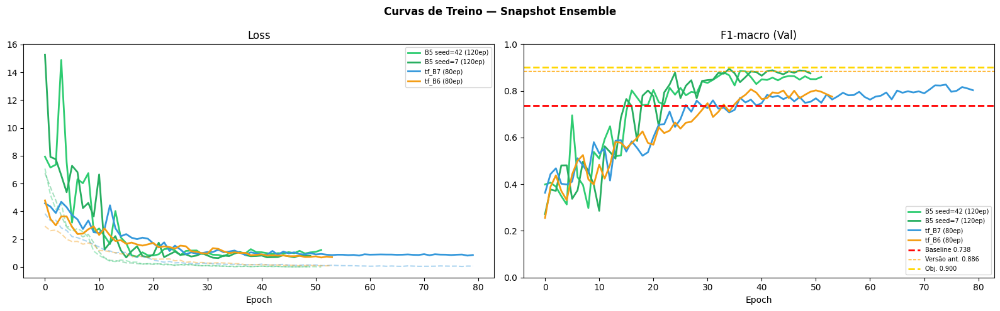

B5 seed=42 : 0.8854  
B5 seed=7  : 0.8945  
tf_B7      : 0.8270  
tf_B6      : 0.8066  


In [16]:
# Curvas de treino
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
names4  = ['B5 seed=42 (120ep)', 'B5 seed=7 (120ep)', 'tf_B7 (80ep)', 'tf_B6 (80ep)']
colors4 = ['#2ecc71', '#27ae60', '#3498db', '#f39c12']

for h, n, c in zip([hist1, hist2, hist3, hist4], names4, colors4):
    axes[0].plot(h['train_loss'], color=c, linestyle='--', alpha=0.4)
    axes[0].plot(h['val_loss'],   color=c, linewidth=2, label=n)
    axes[1].plot(h['val_f1'],     color=c, linewidth=2, label=n)

axes[0].set_title('Loss'); axes[0].legend(fontsize=7); axes[0].set_xlabel('Epoch')
axes[1].axhline(0.738,  color='red',    linestyle='--', linewidth=2, label='Baseline 0.738')
axes[1].axhline(0.8860, color='orange', linestyle='--', linewidth=1, label='Versão ant. 0.886')
axes[1].axhline(0.900,  color='gold',   linestyle='--', linewidth=2, label='Obj. 0.900')
axes[1].set_title('F1-macro (Val)')
axes[1].legend(fontsize=7); axes[1].set_xlabel('Epoch'); axes[1].set_ylim(0, 1)

plt.suptitle('Curvas de Treino — Snapshot Ensemble', fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'training_curves.png'), dpi=150)
plt.show()

print(f'B5 seed=42 : {f1v1:.4f}  ')
print(f'B5 seed=7  : {f1v2:.4f}  ')
print(f'tf_B7      : {f1v3:.4f}  ')
print(f'tf_B6      : {f1v4:.4f}  ')

## Ensemble + TTA

In [17]:
# Recarregar todos os modelos
print(' A recarregar modelos.')

model1 = build_model('efficientnet_b5.sw_in12k_ft_in1k')
model1.load_state_dict(torch.load(ckpt1, map_location=DEVICE))
model1.eval(); print(f'B5 seed=42')

model2 = build_model('efficientnet_b5.sw_in12k_ft_in1k')
model2.load_state_dict(torch.load(ckpt2, map_location=DEVICE))
model2.eval(); print(f'B5 seed=7')

model3 = build_model('tf_efficientnet_b7.aa_in1k')
model3.load_state_dict(torch.load(ckpt3, map_location=DEVICE))
model3.eval(); print(f'tf_B7')

model4.eval(); print(f'tf_B6 (já em memória)')

# TTA no Val Set
print('\n TTA no Val Set.')
_, _, val_labels, pv1 = predict_tta(model1, val_ds)
_, _, _,          pv2 = predict_tta(model2, val_ds)
_, _, _,          pv3 = predict_tta(model3, val_ds)
_, _, _,          pv4 = predict_tta(model4, val_ds)

# Verificar colapso
valid_probs, valid_names, model_objs, ckpts = [], [], [], []
for name, probs, mobj, ck in [
    ('B5_seed42', pv1, model1, ckpt1),
    ('B5_seed7',  pv2, model2, ckpt2),
    ('tf_B7',     pv3, model3, ckpt3),
    ('tf_B6',     pv4, model4, ckpt4),
]:
    n_cls  = len(pd.Series(probs.argmax(1)).unique())
    f1_ind = f1_score(val_labels, probs.argmax(1), average='macro', zero_division=0)
    if n_cls > 1:
        valid_probs.append(probs)
        valid_names.append(name)
        model_objs.append(mobj)
        ckpts.append(ck)
        print(f'  {name}: F1-val={f1_ind:.4f}')
    else:
        print(f'  {name}: COLAPSOU — excluído')

# Grid search de pesos
print('\n Grid search de pesos.')
best_w, best_f1_val = None, 0.0
n_valid = len(valid_probs)

if n_valid == 4:
    for w1 in np.arange(0.1, 0.7, 0.1):
        for w2 in np.arange(0.1, 0.7, 0.1):
            for w3 in np.arange(0.05, 0.5, 0.05):
                w4 = round(1.0 - w1 - w2 - w3, 2)
                if w4 < 0.05 or w4 > 0.6: continue
                ens = w1*valid_probs[0] + w2*valid_probs[1] + w3*valid_probs[2] + w4*valid_probs[3]
                f1  = f1_score(val_labels, ens.argmax(1), average='macro', zero_division=0)
                if f1 > best_f1_val:
                    best_f1_val = f1
                    best_w = (round(w1,2), round(w2,2), round(w3,2), w4)
elif n_valid == 3:
    for w1 in np.arange(0.1, 0.8, 0.05):
        for w2 in np.arange(0.1, 0.8, 0.05):
            w3 = round(1.0 - w1 - w2, 2)
            if w3 < 0.1 or w3 > 0.8: continue
            ens = w1*valid_probs[0] + w2*valid_probs[1] + w3*valid_probs[2]
            f1  = f1_score(val_labels, ens.argmax(1), average='macro', zero_division=0)
            if f1 > best_f1_val:
                best_f1_val = f1
                best_w = (round(w1,2), round(w2,2), w3)
elif n_valid == 2:
    for w1 in np.arange(0.1, 0.95, 0.05):
        w2 = round(1.0 - w1, 2)
        ens = w1*valid_probs[0] + w2*valid_probs[1]
        f1  = f1_score(val_labels, ens.argmax(1), average='macro', zero_division=0)
        if f1 > best_f1_val:
            best_f1_val = f1
            best_w = (round(w1,2), w2)
else:
    best_w = (1.0,)
    best_f1_val = f1_score(val_labels, valid_probs[0].argmax(1),
                           average='macro', zero_division=0)

print(f'\n Pesos: {dict(zip(valid_names, best_w))}')
print(f'   F1-val ensemble: {best_f1_val:.4f}')

 A recarregar modelos.
B5 seed=42
B5 seed=7
tf_B7
tf_B6 (já em memória)

 TTA no Val Set.
  B5_seed42: F1-val=0.9130
  B5_seed7: F1-val=0.8890
  tf_B7: F1-val=0.8426
  tf_B6: F1-val=0.7975

 Grid search de pesos.

 Pesos: {'B5_seed42': np.float64(0.3), 'B5_seed7': np.float64(0.3), 'tf_B7': np.float64(0.05), 'tf_B6': np.float64(0.35)}
   F1-val ensemble: 0.9192


## Resultados Finais

In [18]:
print(' TTA no Test Set.')
test_probs_list, f1_individuals = [], {}

for name, mobj in zip(valid_names, model_objs):
    _, _, test_labels, pt = predict_tta(mobj, test_ds)
    test_probs_list.append(pt)
    f1i = f1_score(test_labels, pt.argmax(1), average='macro', zero_division=0)
    f1_individuals[name] = round(float(f1i), 4)
    print(f'  {name}: F1={f1i:.4f}')

ens_probs   = sum(w*p for w,p in zip(best_w, test_probs_list))
final_preds = ens_probs.argmax(1)
test_f1     = f1_score(test_labels, final_preds, average='macro', zero_division=0)
test_acc    = (final_preds == test_labels).mean()

print(f'\n{"="*60}')
print(f'  RESULTADOS FINAIS — TEST SET')
print(f'{"="*60}')
for n, f in f1_individuals.items():
    print(f'  {n:20s}: {f:.4f}')
print(f'  {"ENSEMBLE + TTA":20s}: {test_f1:.4f}')
print(f'  {"Accuracy":20s}: {test_acc:.4f}')
print(f'  {"Baseline":20s}: 0.738  (Δ {test_f1-0.738:+.4f})')

print(f'{"="*60}')
print(f'\n{classification_report(test_labels, final_preds, target_names=CLASSES, zero_division=0)}')

 TTA no Test Set.
  B5_seed42: F1=0.8841
  B5_seed7: F1=0.8723
  tf_B7: F1=0.8589
  tf_B6: F1=0.8061

  RESULTADOS FINAIS — TEST SET
  B5_seed42           : 0.8841
  B5_seed7            : 0.8723
  tf_B7               : 0.8589
  tf_B6               : 0.8061
  ENSEMBLE + TTA      : 0.9012
  Accuracy            : 0.8983
  Baseline            : 0.738  (Δ +0.1632)

               precision    recall  f1-score   support

Biliary Leaks       1.00      0.91      0.95        23
    Lithiasis       0.88      0.94      0.91       109
    Stricture       0.95      0.88      0.91        59
       Normal       0.84      0.82      0.83        45

     accuracy                           0.90       236
    macro avg       0.92      0.89      0.90       236
 weighted avg       0.90      0.90      0.90       236



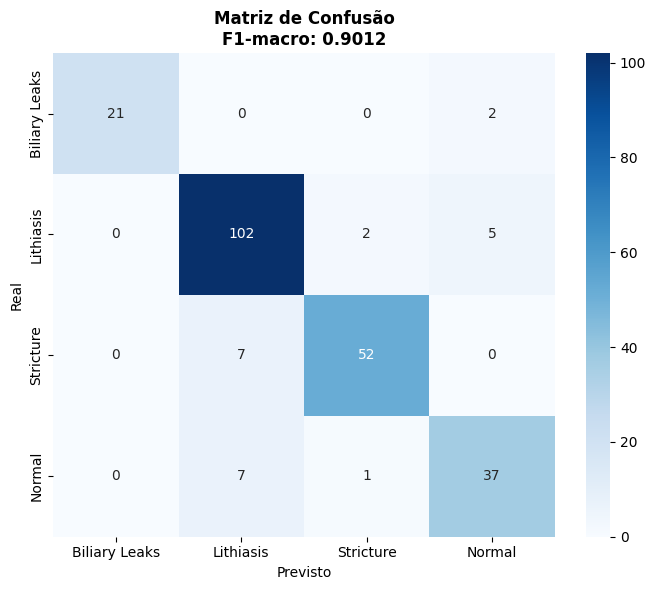

In [19]:
# Matriz de Confusão
cm = confusion_matrix(test_labels, final_preds)
fig, ax = plt.subplots(figsize=(7, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASSES, yticklabels=CLASSES, ax=ax)
ax.set_xlabel('Previsto'); ax.set_ylabel('Real')
ax.set_title(f'Matriz de Confusão\nF1-macro: {test_f1:.4f}', fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'confusion_matrix.png'), dpi=150)
plt.show()

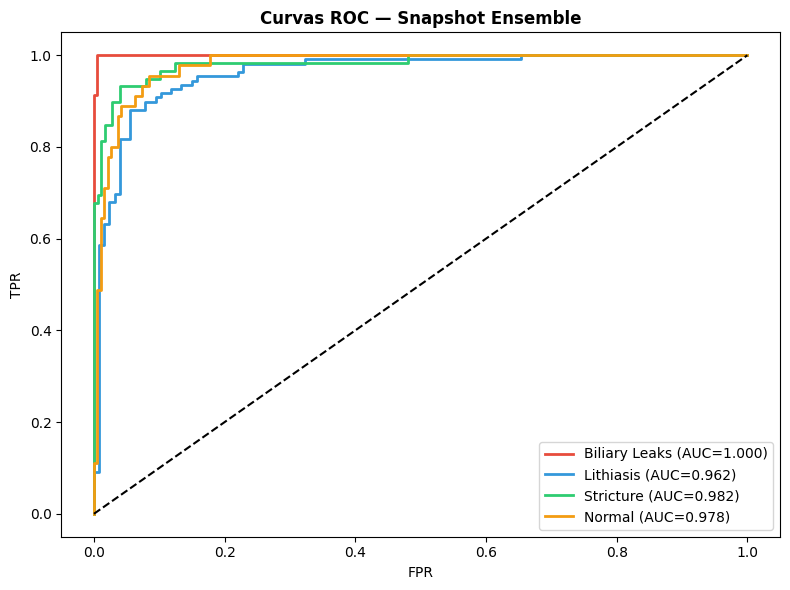

AUC-ROC macro: 0.9804


In [20]:
# AUC-ROC
y_bin = label_binarize(test_labels, classes=list(range(NUM_CLASSES)))
fig, ax = plt.subplots(figsize=(8, 6))
for i, (cls, col) in enumerate(
    zip(CLASSES, ['#e74c3c','#3498db','#2ecc71','#f39c12'])
):
    fpr, tpr, _ = roc_curve(y_bin[:,i], ens_probs[:,i])
    auc = roc_auc_score(y_bin[:,i], ens_probs[:,i])
    ax.plot(fpr, tpr, lw=2, color=col, label=f'{cls} (AUC={auc:.3f})')
ax.plot([0,1],[0,1],'k--')
ax.set_xlabel('FPR'); ax.set_ylabel('TPR')
ax.set_title('Curvas ROC — Snapshot Ensemble', fontweight='bold')
ax.legend(loc='lower right')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'roc_curves.png'), dpi=150)
plt.show()
macro_auc = roc_auc_score(y_bin, ens_probs, average='macro')
print(f'AUC-ROC macro: {macro_auc:.4f}')

## Grad-CAM 

 B5_seed42: target_layer = Conv2d


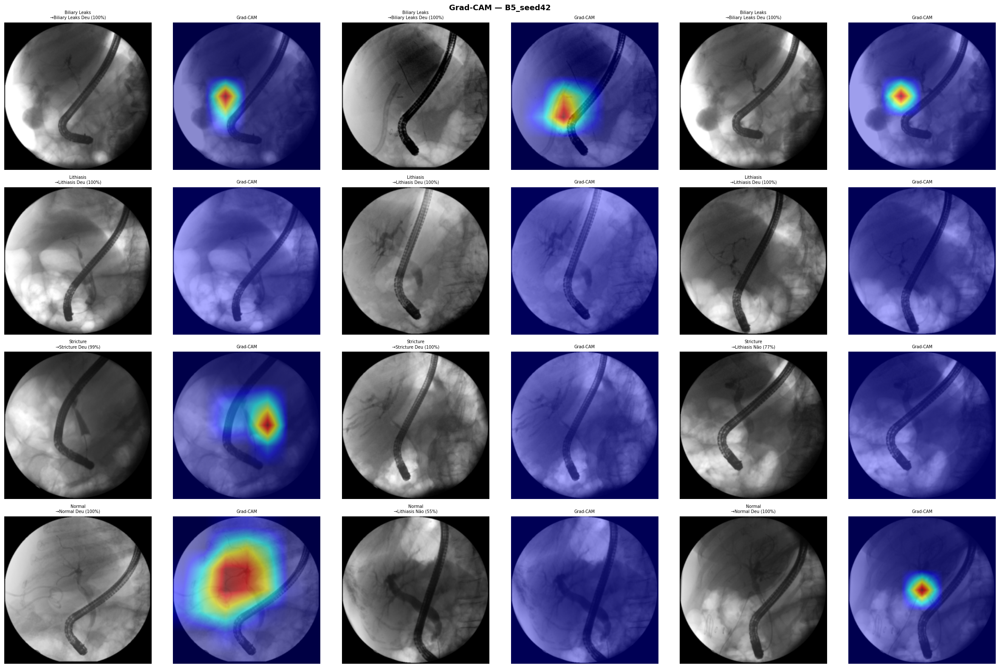

 /kaggle/working/gradcam/gradcam_B5_seed42.png
 B5_seed7: target_layer = Conv2d


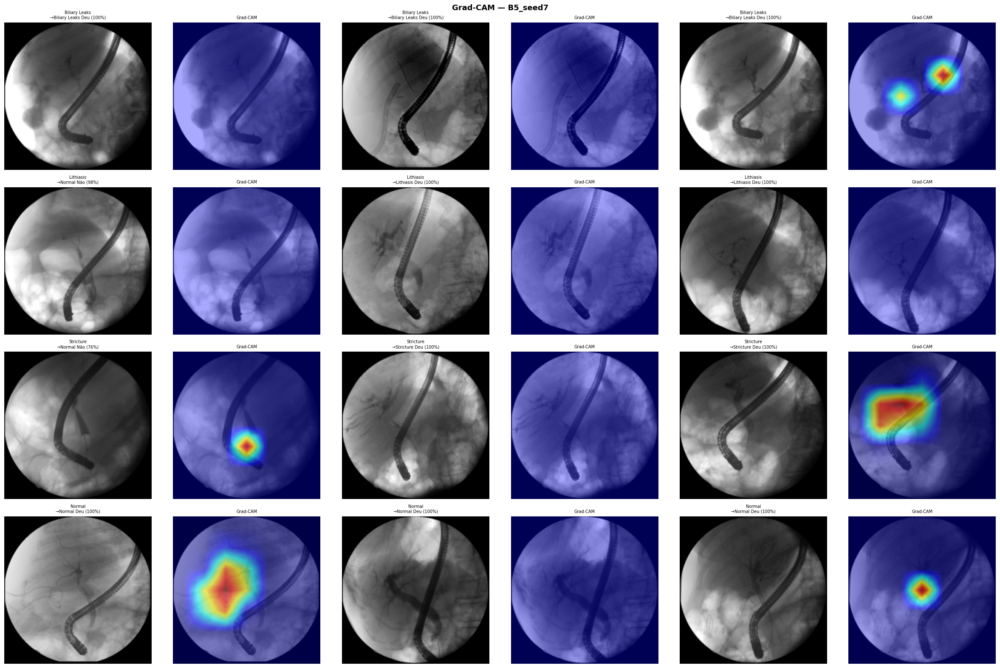

 /kaggle/working/gradcam/gradcam_B5_seed7.png
 tf_B7: target_layer = Conv2d


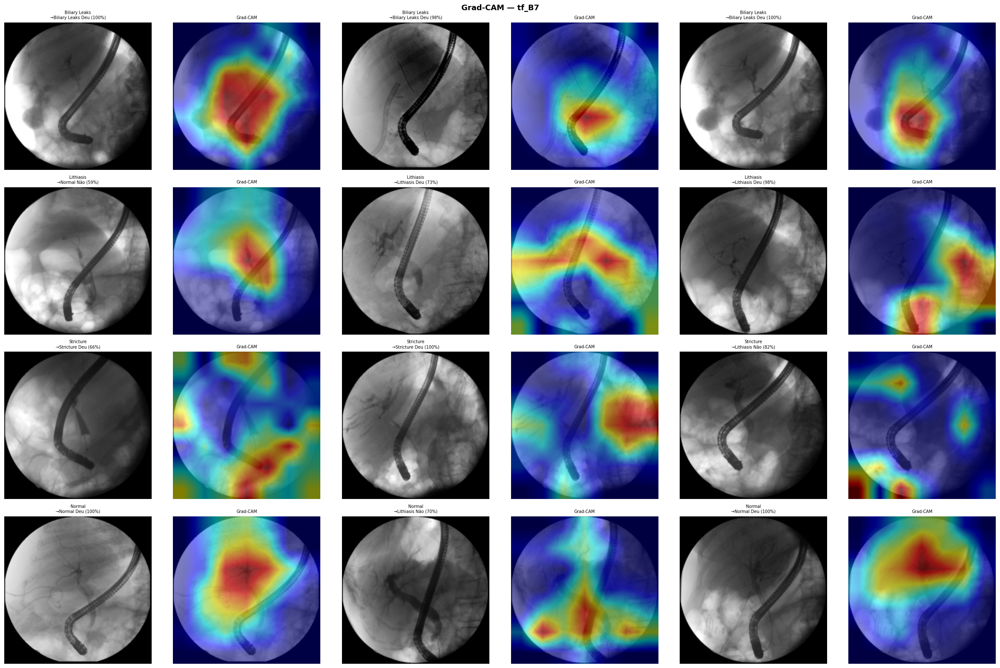

 /kaggle/working/gradcam/gradcam_tf_B7.png
 tf_B6: target_layer = Conv2d


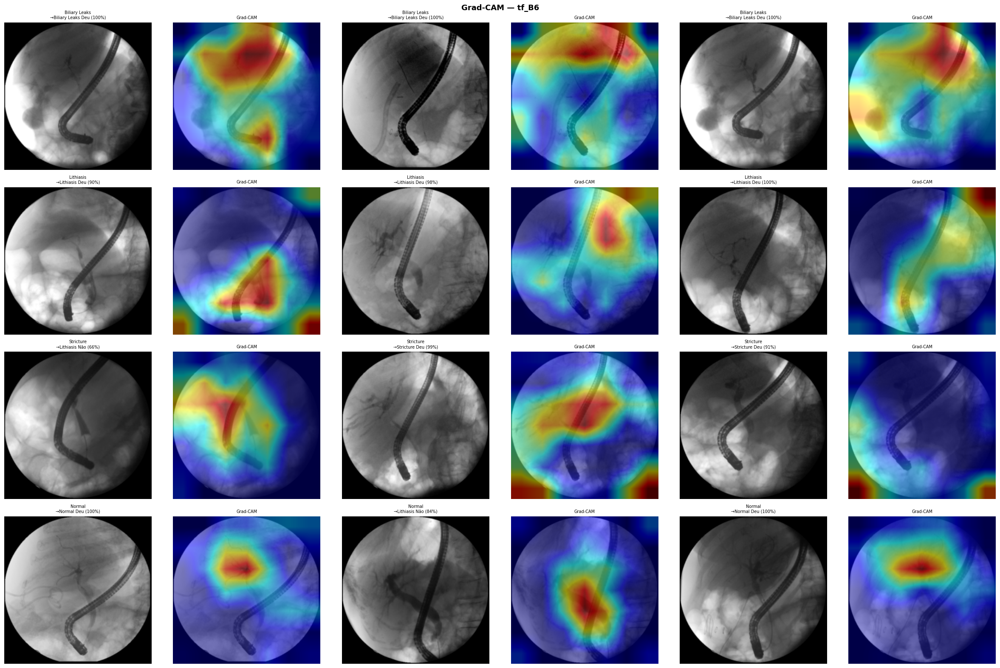

 /kaggle/working/gradcam/gradcam_tf_B6.png


In [21]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

def denorm(t):
    m = torch.tensor(MEAN).view(3,1,1)
    s = torch.tensor(STD).view(3,1,1)
    return torch.clamp(t*s+m, 0, 1)

def gradcam_grid(model, target_layer, dataset, name, n=3):
    model.eval()
    cam = GradCAM(model=model, target_layers=[target_layer])
    by_cls = {i: [] for i in range(NUM_CLASSES)}
    for idx, lbl in enumerate(dataset.labels):
        if len(by_cls[lbl]) < n: by_cls[lbl].append(idx)

    fig, axes = plt.subplots(NUM_CLASSES, n*2, figsize=(4*n*2, 4*NUM_CLASSES))
    for row in range(NUM_CLASSES):
        for col, si in enumerate(by_cls[row]):
            t, lbl = dataset[si]
            inp = t.unsqueeze(0).to(DEVICE)
            with torch.no_grad():
                out  = model(inp)
                pred = out.argmax(1).item()
                conf = torch.softmax(out,1).max().item()
            mask    = cam(inp, [ClassifierOutputTarget(pred)])[0]
            img_np  = denorm(t).permute(1,2,0).numpy()
            overlay = show_cam_on_image(img_np.astype(np.float32), mask, use_rgb=True)
            ok = 'Deu' if pred==lbl else 'Não'
            ti = f'{CLASSES[lbl]}\n→{CLASSES[pred]} {ok} ({conf:.0%})'
            axes[row][col*2].imshow(img_np, cmap='gray')
            axes[row][col*2].set_title(ti, fontsize=7)
            axes[row][col*2].axis('off')
            if col==0:
                axes[row][0].set_ylabel(CLASSES[row], fontsize=9, fontweight='bold')
            axes[row][col*2+1].imshow(overlay)
            axes[row][col*2+1].set_title('Grad-CAM', fontsize=7)
            axes[row][col*2+1].axis('off')

    plt.suptitle(f'Grad-CAM — {name}', fontsize=13, fontweight='bold')
    plt.tight_layout()
    p = os.path.join(GRADCAM_DIR, f'gradcam_{name}.png')
    plt.savefig(p, dpi=150, bbox_inches='tight')
    plt.show()
    print(f' {p}')

def get_gradcam_layer(model):
    """
    Devolve a última camada convolucional de forma robusta,
    compatível com efficientnet_b5, tf_efficientnet_b7 e tf_efficientnet_b6.
    """
    # Tentativa 1: conv_head (b5 sw_in12k)
    if hasattr(model, 'conv_head'):
        return model.conv_head
    # Tentativa 2: último bloco do backbone (tf_ variants)
    if hasattr(model, 'blocks'):
        last_block = list(model.blocks[-1].children())
        if last_block:
            return last_block[-1]
    # Fallback: última camada Conv2d encontrada
    last_conv = None
    for m in model.modules():
        if isinstance(m, torch.nn.Conv2d):
            last_conv = m
    return last_conv

# Grad-CAM para todos os modelos válidos
for name, mobj in zip(valid_names, model_objs):
    target_layer = get_gradcam_layer(mobj)
    print(f' {name}: target_layer = {target_layer.__class__.__name__}')
    gradcam_grid(mobj, target_layer, test_ds, name)

### Análise de Erros — Casos Mal Classificados

Identificação dos erros mais frequentes e visualização Grad-CAM nos casos onde o ensemble falhou.

Especial atenção a **falsos negativos de Stricture e Biliary Leaks** (implicações clínicas graves).

 Test set: 236 imagens
   Corretas : 212 (89.8%)
   Erradas  : 24 (10.2%)

 Erros por par de classes (Real → Previsto):
   Normal             → Lithiasis         :   7 casos
   Stricture          → Lithiasis         :   7 casos  Critico
   Lithiasis          → Normal            :   5 casos
   Lithiasis          → Stricture         :   2 casos
   Biliary Leaks      → Normal            :   2 casos  Critico
   Normal             → Stricture         :   1 casos

 Análise clínica de falsos negativos (recall por classe):
   Biliary Leaks       : Recall=0.913 | Precision=1.000 | FN=2
   Lithiasis           : Recall=0.936 | Precision=0.879 | FN=7
   Stricture           : Recall=0.881 | Precision=0.945 | FN=7
   Normal              : Recall=0.822 | Precision=0.841 | FN=8

 Nota clínica: Falsos negativos em Stricture (estenoses) e Biliary Leaks
   podem atrasar diagnóstico crítico. O modelo deve priorizar recall nestas classes.

 Grad-CAM — casos mal classificados (até 3 por classe real):


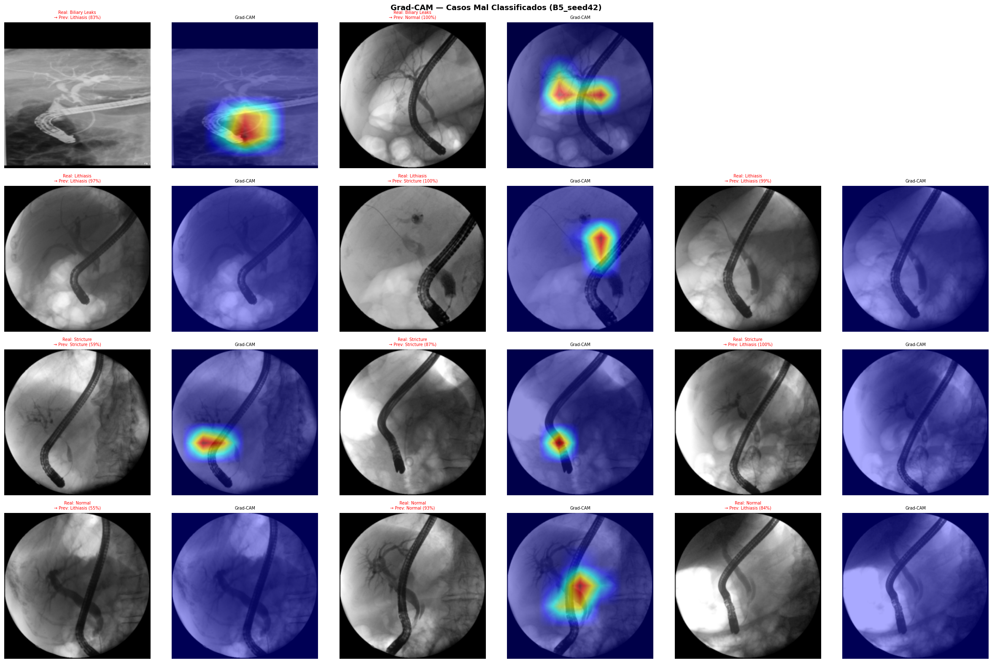

 Guardado: /kaggle/working/gradcam/gradcam_errors.png


In [22]:
#  Análise de erros — misclassified examples + Grad-CAM

#  Identificar erros 
errors_idx  = np.where(final_preds != test_labels)[0]
correct_idx = np.where(final_preds == test_labels)[0]

print(f' Test set: {len(test_labels)} imagens')
print(f'   Corretas : {len(correct_idx)} ({len(correct_idx)/len(test_labels):.1%})')
print(f'   Erradas  : {len(errors_idx)} ({len(errors_idx)/len(test_labels):.1%})')

#  Tabela de erros por par (real vs previsto) 
print('\n Erros por par de classes (Real → Previsto):')
from collections import Counter
err_pairs = Counter(zip(test_labels[errors_idx], final_preds[errors_idx]))
err_table = sorted(err_pairs.items(), key=lambda x: -x[1])
for (real, pred), cnt in err_table:
    severity = '  Critico' if CLASSES[real] in ['Stricture', 'Biliary Leaks'] else ''
    print(f'   {CLASSES[real]:<18} → {CLASSES[pred]:<18}: {cnt:3d} casos{severity}')

# Discussão clínica de falsos negativos 
print('\n Análise clínica de falsos negativos (recall por classe):')
from sklearn.metrics import recall_score, precision_score
for i, cls in enumerate(CLASSES):
    tp = np.sum((test_labels == i) & (final_preds == i))
    fn = np.sum((test_labels == i) & (final_preds != i))
    fp = np.sum((test_labels != i) & (final_preds == i))
    recall    = tp / (tp + fn) if (tp + fn) > 0 else 0
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    severity = ''
    if cls in ['Stricture', 'Biliary Leaks'] and recall < 0.85:
        severity = ' Atenção: FN clinicamente graves!'
    print(f'   {cls:<20}: Recall={recall:.3f} | Precision={precision:.3f} | FN={fn}{severity}')

print('\n Nota clínica: Falsos negativos em Stricture (estenoses) e Biliary Leaks')
print('   podem atrasar diagnóstico crítico. O modelo deve priorizar recall nestas classes.')

#  4. Grad-CAM nos casos mal classificados 
print('\n Grad-CAM — casos mal classificados (até 3 por classe real):')

best_model_name = valid_names[0]  # Modelo com maior peso no ensemble
best_model_obj  = model_objs[0]
best_model_obj.eval()
target_layer_err = get_gradcam_layer(best_model_obj)
cam_err = GradCAM(model=best_model_obj, target_layers=[target_layer_err])

n_per_class = 3
by_class_errors = {i: [] for i in range(NUM_CLASSES)}
for idx in errors_idx:
    lbl = test_labels[idx]
    if len(by_class_errors[lbl]) < n_per_class:
        by_class_errors[lbl].append(idx)

# Apenas classes que têm erros
classes_with_errors = [i for i in range(NUM_CLASSES) if by_class_errors[i]]
if classes_with_errors:
    fig, axes = plt.subplots(len(classes_with_errors), n_per_class*2,
                             figsize=(4*n_per_class*2, 4*len(classes_with_errors)))
    if len(classes_with_errors) == 1:
        axes = [axes]
    fig.suptitle(f'Grad-CAM — Casos Mal Classificados ({best_model_name})',
                 fontsize=13, fontweight='bold')

    for row_i, cls_idx in enumerate(classes_with_errors):
        idxs = by_class_errors[cls_idx]
        for col_i, sample_idx in enumerate(idxs):
            t, lbl = test_ds[sample_idx]
            inp = t.unsqueeze(0).to(DEVICE)
            with torch.no_grad():
                out  = best_model_obj(inp)
                pred = out.argmax(1).item()
                conf = torch.softmax(out,1).max().item()
            mask    = cam_err(inp, [ClassifierOutputTarget(pred)])[0]
            img_np  = denorm(t).permute(1,2,0).numpy()
            overlay = show_cam_on_image(img_np.astype(np.float32), mask, use_rgb=True)
            ti      = f'Real: {CLASSES[lbl]}\n→ Prev: {CLASSES[pred]} ({conf:.0%})'
            axes[row_i][col_i*2].imshow(img_np, cmap='gray')
            axes[row_i][col_i*2].set_title(ti, fontsize=7, color='red')
            axes[row_i][col_i*2].axis('off')
            if col_i == 0:
                axes[row_i][0].set_ylabel(CLASSES[cls_idx], fontsize=9,
                                          fontweight='bold', rotation=90)
            axes[row_i][col_i*2+1].imshow(overlay)
            axes[row_i][col_i*2+1].set_title('Grad-CAM', fontsize=7)
            axes[row_i][col_i*2+1].axis('off')
        # Preencher colunas vazias se menos de n_per_class erros
        for col_i in range(len(idxs), n_per_class):
            axes[row_i][col_i*2].axis('off')
            axes[row_i][col_i*2+1].axis('off')

    plt.tight_layout()
    p = os.path.join(GRADCAM_DIR, 'gradcam_errors.png')
    plt.savefig(p, dpi=150, bbox_inches='tight')
    plt.show()
    print(f' Guardado: {p}')
else:
    print(' Sem erros no test set')


## Guardar Resultados

In [23]:
from sklearn.metrics import precision_recall_fscore_support
prec, rec, f1p, _ = precision_recall_fscore_support(
    test_labels, final_preds, labels=list(range(NUM_CLASSES)), zero_division=0
)

metrics = {
    'protocolo'      : 'Snapshot Ensemble — B5x2 + B7 + B6',
    'seed'           : int(SEED),
    'filtro_keep'    : 'Keep=Keep (igual ao artigo)',
    'split'          : 'Estratificado 70/15/15',
    'normalizacao'   : 'ImageNet [0.485, 0.456, 0.406]',
    'clahe'          : bool(USE_CLAHE),
    'models'         : valid_names,
    'epochs'         : {
        'B5_seed42': int(EPOCHS_B5_S42),
        'B5_seed7' : int(EPOCHS_B5_S7),
        'B7'       : int(EPOCHS_B7),
        'B6'       : int(EPOCHS_B6)
    },
    'weights'        : [float(w) for w in best_w],
    'tta'            : int(len(tta_transforms)),
    'n_train'        : int(len(train_ds)),
    'n_val'          : int(len(val_ds)),
    'n_test'         : int(len(test_ds)),
    'test_accuracy'  : round(float(test_acc), 4),
    'f1_macro'       : round(float(test_f1), 4),
    'auc_roc_macro'  : round(float(macro_auc), 4),
    'baseline_f1'    : 0.738,
    'versao_anterior': 0.8860,
    'delta_baseline' : round(float(test_f1)-0.738, 4),
    'delta_anterior' : round(float(test_f1)-0.8860, 4),
    'individual_f1'  : {k: float(v) for k, v in f1_individuals.items()},
    'per_class'      : {
        cls: {'precision': round(float(p),4),
              'recall':    round(float(r),4),
              'f1':        round(float(f),4)}
        for cls,p,r,f in zip(CLASSES,prec,rec,f1p)
    }
}

with open(os.path.join(RESULTS_DIR, 'metrics_final.json'), 'w') as fp:
    json.dump(metrics, fp, indent=2)

rows = [
    {'Modelo': 'Baseline (artigo)',     'F1-macro': 0.738,  'AUC-ROC': '-'},
]
for n, f in f1_individuals.items():
    rows.append({'Modelo': n, 'F1-macro': float(f), 'AUC-ROC': '-'})
rows.append({'Modelo': 'SNAPSHOT ENSEMBLE',
             'F1-macro': round(test_f1,4),
             'AUC-ROC': round(macro_auc,4)})

table = pd.DataFrame(rows)
table.to_csv(os.path.join(RESULTS_DIR, 'comparison_table.csv'), index=False)

print('\n'+'='*60)
print('         Resumo')
print('='*60)
print(table.to_string(index=False))
print('='*60)
print(f'  Δ vs baseline    : {test_f1-0.738:+.4f}')
if test_f1 >= 0.738:
    print('  Baseline superado')

print('='*60)


         Resumo
           Modelo  F1-macro AUC-ROC
Baseline (artigo)    0.7380       -
        B5_seed42    0.8841       -
         B5_seed7    0.8723       -
            tf_B7    0.8589       -
            tf_B6    0.8061       -
SNAPSHOT ENSEMBLE    0.9012  0.9804
  Δ vs baseline    : +0.1632
  Baseline superado


Modelo            Train F1     Val F1    Test F1   Δ Train-Val  Diagnóstico
------------------------------------------------------------------------------------------
B5_seed42           0.9961     0.8854     0.8916       +0.1107  Overfitting
B5_seed7            0.9830     0.8945     0.8332       +0.0885  Overfitiing ligeiro 
tf_B7               0.9689     0.8270     0.8328       +0.1420  Overfitting
tf_B6               0.9116     0.8066     0.7839       +0.1050  Overfitting

  Δ Train-Val > +0.10  ->  Overfitting)
  Val F1 < 0.60 e Train F1 < 0.60  ->  Underfitting 
  |Δ| ≤ 0.05  -> Bom fit 


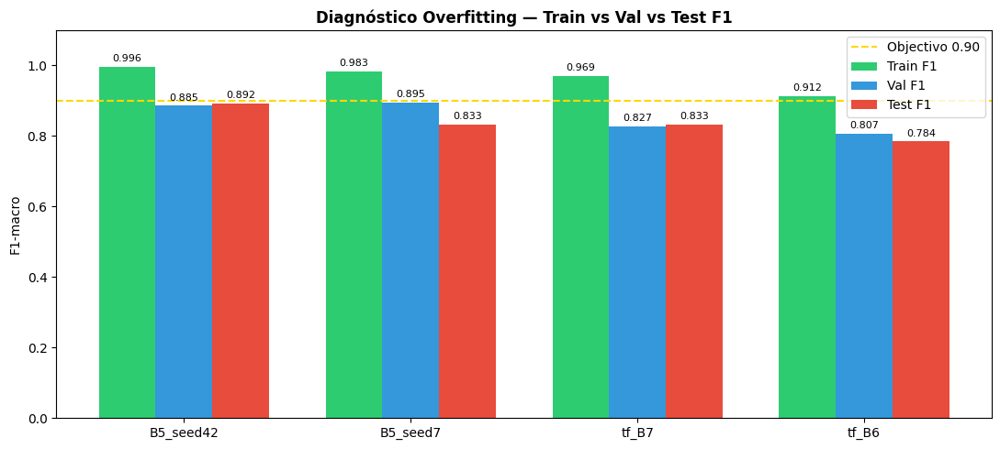

In [25]:
# Diagnostico de over/underfitting 
# Compara F1-macro em Train / Val / Test para cada modelo


@torch.no_grad()
def evaluate_f1(model, loader):
    model.eval()
    preds, labels = [], []
    for imgs, lbls in loader:
        imgs = imgs.to(DEVICE)
        out  = model(imgs)
        preds.extend(out.argmax(1).cpu().numpy())
        labels.extend(lbls.numpy())
    return f1_score(labels, preds, average='macro', zero_division=0)


# Train loader sem augmentation — avalia memorização real do modelo
train_noaug_ds     = ERCPDataset(df_train, val_transform)
train_noaug_loader = DataLoader(
    train_noaug_ds, batch_size=16, shuffle=False, num_workers=NUM_WORKERS
)
make_loaders(16)  # garante val_loader e test_loader actualizados

# Configurações dos 4 modelos
model_configs = [
    ('B5_seed42', 'efficientnet_b5.sw_in12k_ft_in1k', ckpt1),
    ('B5_seed7',  'efficientnet_b5.sw_in12k_ft_in1k', ckpt2),
    ('tf_B7',     'tf_efficientnet_b7.aa_in1k',       ckpt3),
    ('tf_B6',     'tf_efficientnet_b6.aa_in1k',       ckpt4),
]

print(f"{'Modelo':<15} {'Train F1':>10} {'Val F1':>10} {'Test F1':>10} "
      f"{'Δ Train-Val':>13}  {'Diagnóstico'}")
print('-' * 90)

diag_data = []
for name, arch, ckpt_path in model_configs:
    m = build_model(arch)
    m.load_state_dict(torch.load(ckpt_path, map_location=DEVICE))
    m.eval()

    tr_f1  = evaluate_f1(m, train_noaug_loader)
    val_f1 = evaluate_f1(m, val_loader)
    te_f1  = evaluate_f1(m, test_loader)
    gap    = tr_f1 - val_f1

    if gap > 0.10:
        diag = 'Overfitting'
    elif val_f1 < 0.60 and tr_f1 < 0.60:
        diag = 'Underfittitng'
    elif abs(gap) <= 0.05:
        diag = 'Boa generalização'
    else:
        diag = 'Overfitiing ligeiro '

    print(f"{name:<15} {tr_f1:>10.4f} {val_f1:>10.4f} {te_f1:>10.4f} "
          f"{gap:>+13.4f}  {diag}")
    diag_data.append({'name': name, 'train': tr_f1, 'val': val_f1, 'test': te_f1})

    m.cpu(); del m
    gc.collect(); torch.cuda.empty_cache()

print()

print("  Δ Train-Val > +0.10  ->  Overfitting)")
print("  Val F1 < 0.60 e Train F1 < 0.60  ->  Underfitting ")
print("  |Δ| ≤ 0.05  -> Bom fit ")

#  Plot comparativo 
fig, ax = plt.subplots(figsize=(11, 5))
x = np.arange(len(diag_data))
w = 0.25
b_tr  = ax.bar(x - w, [d['train'] for d in diag_data], w, label='Train F1',  color='#2ecc71')
b_val = ax.bar(x,     [d['val']   for d in diag_data], w, label='Val F1',    color='#3498db')
b_te  = ax.bar(x + w, [d['test']  for d in diag_data], w, label='Test F1',   color='#e74c3c')

ax.set_xticks(x); ax.set_xticklabels([d['name'] for d in diag_data])
ax.set_ylabel('F1-macro'); ax.set_ylim(0, 1.1)
ax.set_title('Diagnóstico Overfitting — Train vs Val vs Test F1', fontweight='bold')
ax.axhline(0.90, color='gold', linestyle='--', linewidth=1.5, label='Objectivo 0.90')
ax.legend()

for bars in [b_tr, b_val, b_te]:
    for bar in bars:
        h = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, h + 0.01,
                f'{h:.3f}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'overfitting_diagnosis.png'), dpi=150)
plt.show()